In [0]:
from fastai.vision import *
from fastai import *

Choose an appropriate name for your labeled images. You can run these steps multiple times to create different labels.

In [14]:
folder = 'Vader'
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"
base_dir = root_dir + 'fastai-v3/data'
file = 'urls_vader.csv'

path = Path(base_dir)
dest = path/folder
dest.mkdir(parents=True, exist_ok=True)

Mounted at /content/gdrive


In [15]:
folder = 'Kylo'
drive.mount('/content/gdrive', force_remount=True)
root_dir = "/content/gdrive/My Drive/"
base_dir = root_dir + 'fastai-v3/data'
file = 'urls_kylo.csv'

path = Path(base_dir)
dest = path/folder
dest.mkdir(parents=True, exist_ok=True)

Mounted at /content/gdrive


You will need to run this cell once per each category.

In [17]:
path.ls()

[PosixPath('/content/gdrive/My Drive/fastai-v3/data/Vader'),
 PosixPath('/content/gdrive/My Drive/fastai-v3/data/Kylo'),
 PosixPath('/content/gdrive/My Drive/fastai-v3/data/vader'),
 PosixPath('/content/gdrive/My Drive/fastai-v3/data/kylo'),
 PosixPath('/content/gdrive/My Drive/fastai-v3/data/models'),
 PosixPath('/content/gdrive/My Drive/fastai-v3/data/cleaned.csv')]

## Download images

In [0]:
classes = ['vader','kylo']

In [0]:
help(download_images)

Help on function download_images in module fastai.vision.data:

download_images(urls:Collection[str], dest:Union[pathlib.Path, str], max_pics:int=1000, max_workers:int=8, timeout=4)
    Download images listed in text file `urls` to path `dest`, at most `max_pics`



In [0]:
download_images(path/folder/file, dest, max_pics=200)

In [0]:
download_images(path/file, dest, max_pics=20, max_workers=0)

Then we can remove any images that can't be opened:

In [19]:
for c in classes:
    print(c)
    verify_images(path/c, delete=True, max_size=500)

vader


/usr/local/lib/python3.6/dist-packages/fastprogress/fastprogress.py:102: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


kylo


## View data

In [0]:
np.random.seed(42)
data = ImageDataBunch.from_folder(path, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

In [0]:
#If you already cleaned your data, run this cell instead of the one before
np.random.seed(42)
data = ImageDataBunch.from_csv(path, folder=".", valid_pct=0.2, csv_labels='cleaned.csv',
         ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)

Good! Let's take a look at some of our pictures then.

In [21]:
data.classes

['Kylo', 'Vader']

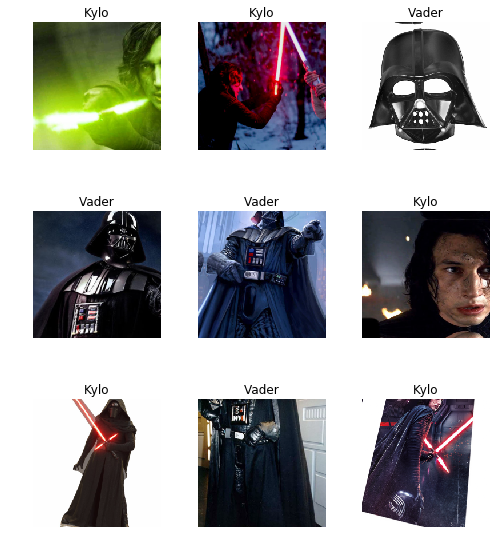

In [0]:
data.show_batch(rows=3, figsize=(7,8))

In [22]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['Kylo', 'Vader'], 2, 286, 71)

## Train model

In [0]:
learn = cnn_learner(data, models.resnet50, metrics=error_rate)

In [24]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,0.812963,0.329234,0.154930,03:40
1,0.510841,0.137943,0.042254,03:36
2,0.349132,0.152274,0.070423,03:34
3,0.284493,0.131682,0.070423,03:34


In [0]:
learn.save('stage-1')

In [0]:
learn.unfreeze()

In [27]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


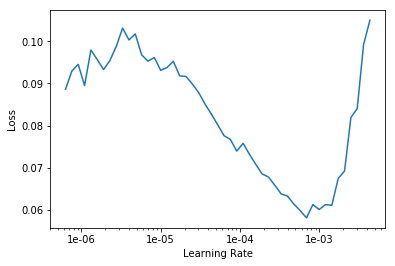

In [28]:
learn.recorder.plot()

In [29]:
learn.fit_one_cycle(2, max_lr=slice(3e-5,3e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.093106,0.063346,0.028169,04:30
1,0.071501,0.067660,0.028169,04:30


In [0]:
learn.save('stage-2')

## Interpretation

In [0]:
learn.load('stage-2');

In [0]:
interp = ClassificationInterpretation.from_learner(learn)

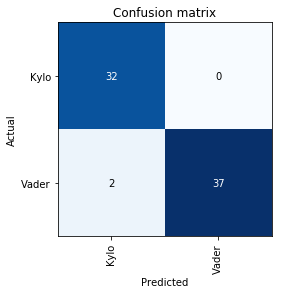

In [33]:
interp.plot_confusion_matrix()

## Exporting


In [0]:
learn.export()

In [0]:
defaults.device = torch.device('cpu')

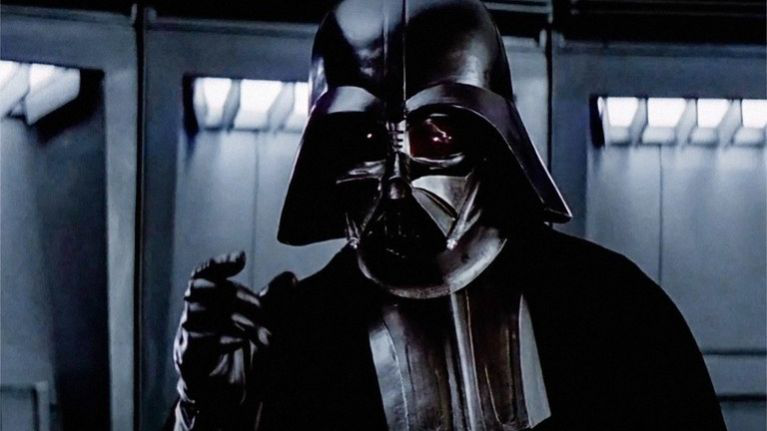

In [39]:
img = open_image(path/'vader-2.jpg')
img

We create our `Learner` in production enviromnent like this, jsut make sure that `path` contains the file 'export.pkl' from before.

In [0]:
learn = load_learner(path)

In [41]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category Vader

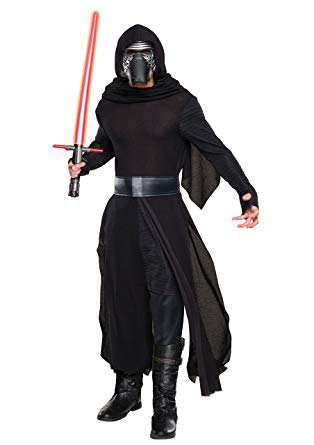

In [49]:
img = open_image(path/'kylo-2.jpg')
img

In [50]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category Kylo

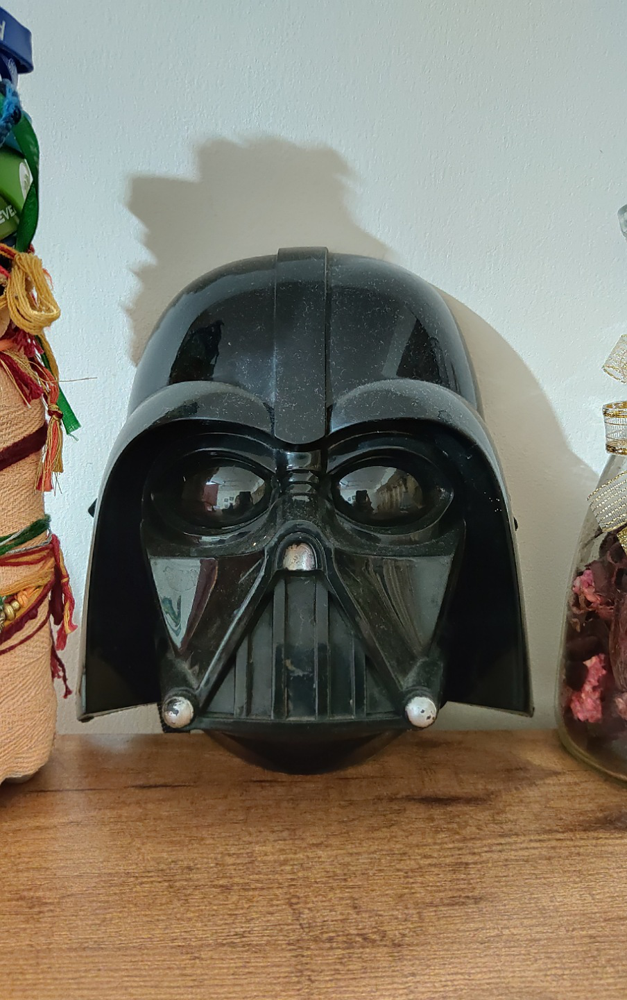

In [53]:
img = open_image(path/'vader-7.jpg')
img

In [54]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category Vader

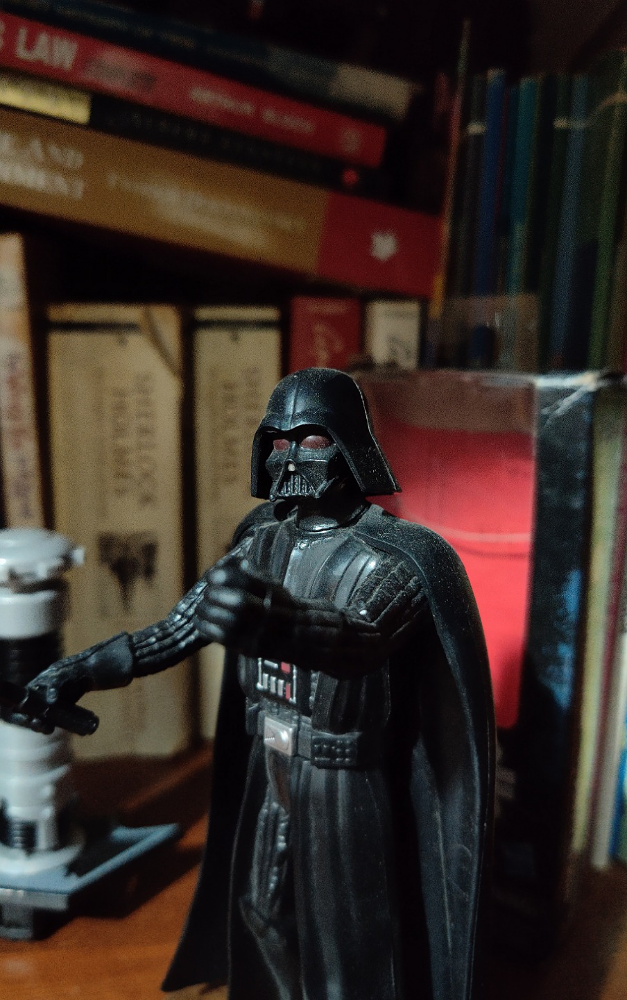

In [56]:
img = open_image(path/'vader-8.jpg')
img

In [58]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category Kylo

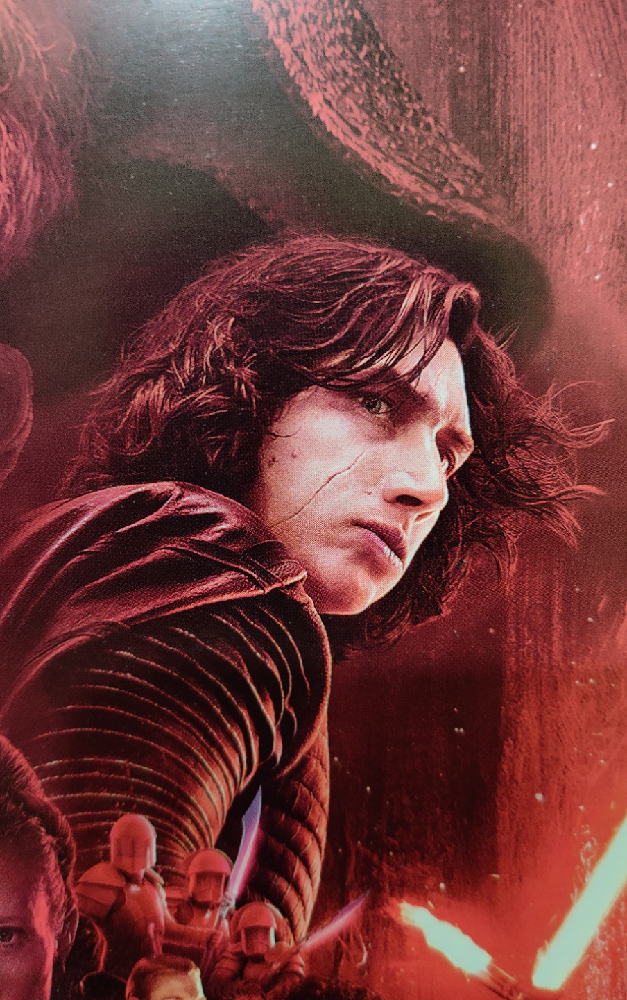

In [59]:
img = open_image(path/'kylo-8.jpg')
img

In [60]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category Kylo

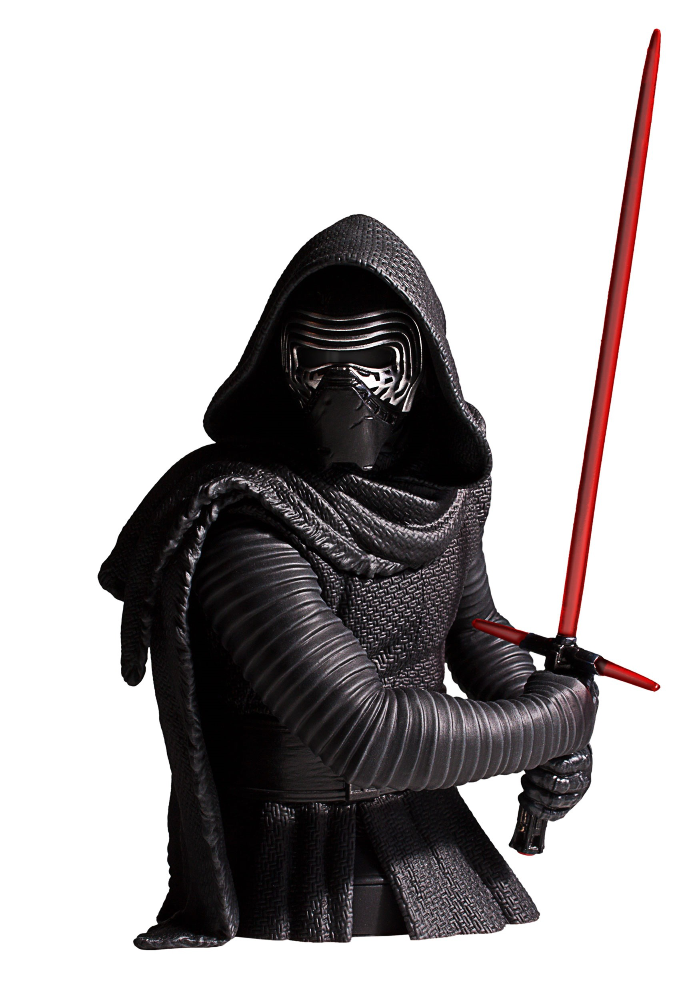

In [61]:
img = open_image(path/'kylo-1.jpg')
img

In [62]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category Kylo

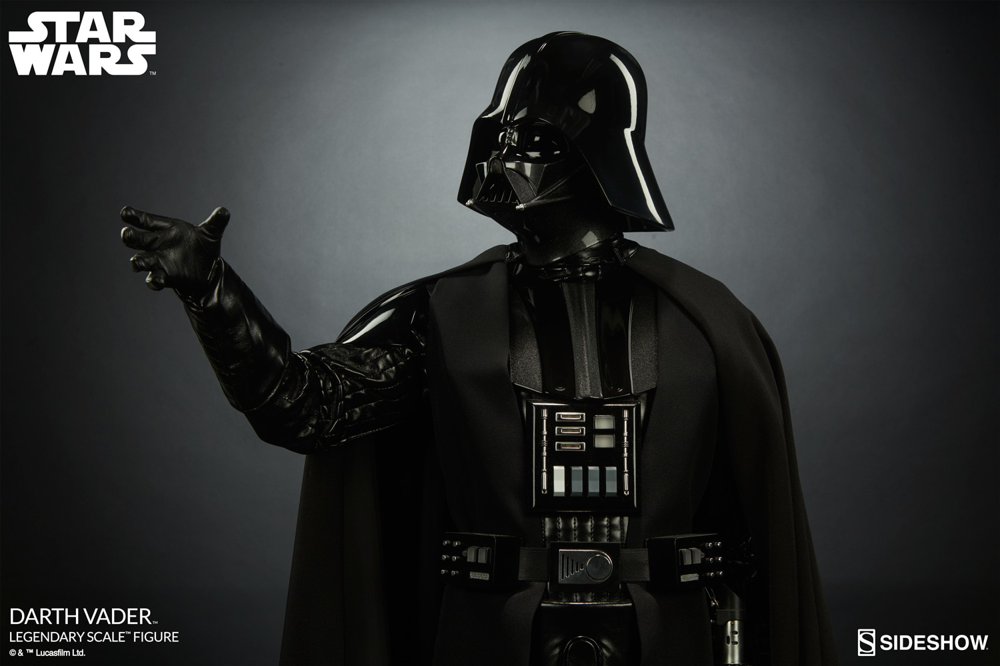

In [63]:
img = open_image(path/'vader-3.jpg')
img

In [64]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category Vader